<Figure size 1200x800 with 0 Axes>

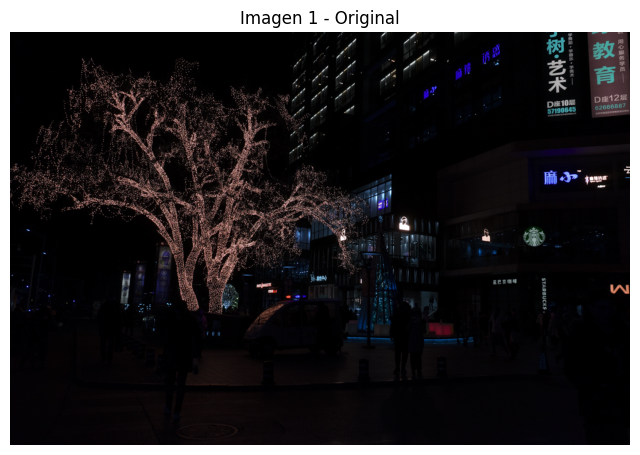

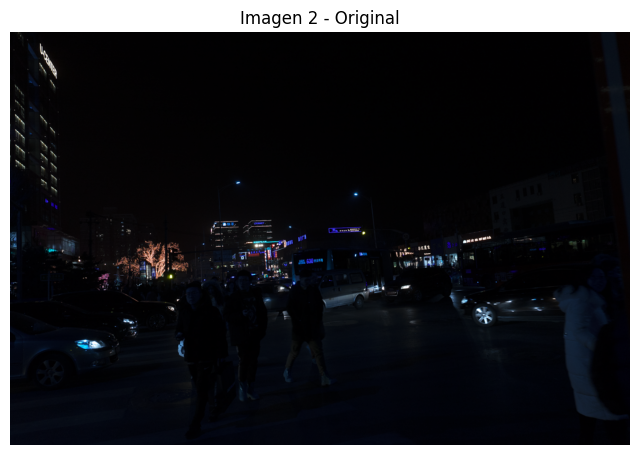

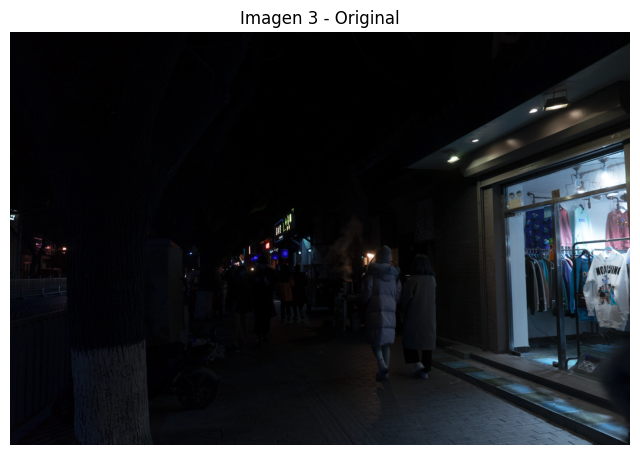

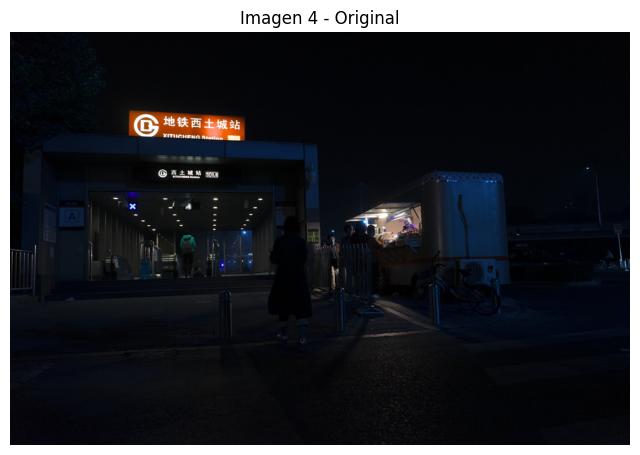

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


def mostrar_imagen(imagen, titulo):
    # Convertir la imagen de BGR (OpenCV) a RGB (Matplotlib)
    imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(imagen_rgb)
    plt.title(titulo)
    plt.axis('off')
    plt.show()
    
def comparar_imagenes(imagen1, titulo1, imagen2, titulo2):

    imagen1_rgb = cv2.cvtColor(imagen1, cv2.COLOR_BGR2RGB)
    imagen2_rgb = cv2.cvtColor(imagen2, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1) 
    plt.imshow(imagen1_rgb)
    plt.title(titulo1)
    plt.axis('off')
        
    plt.subplot(1, 2, 2) 
    plt.imshow(imagen2_rgb)
    plt.title(titulo2)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def comparar_tres_imagenes(imagen1, titulo1, imagen2, titulo2, imagen3, titulo3):

    # Convertir las imágenes de BGR a RGB para Matplotlib
    imagen1_rgb = cv2.cvtColor(imagen1, cv2.COLOR_BGR2RGB)
    imagen2_rgb = cv2.cvtColor(imagen2, cv2.COLOR_BGR2RGB)
    imagen3_rgb = cv2.cvtColor(imagen3, cv2.COLOR_BGR2RGB)
    
    # Crear la figura
    plt.figure(figsize=(18, 6))  # Ajustar tamaño para que entren las tres imágenes
    
    # Mostrar la primera imagen
    plt.subplot(1, 3, 1)  # 1 fila, 3 columnas, posición 1
    plt.imshow(imagen1_rgb)
    plt.title(titulo1)
    plt.axis('off')
    
    # Mostrar la segunda imagen
    plt.subplot(1, 3, 2)  # 1 fila, 3 columnas, posición 2
    plt.imshow(imagen2_rgb)
    plt.title(titulo2)
    plt.axis('off')
    
    # Mostrar la tercera imagen
    plt.subplot(1, 3, 3)  # 1 fila, 3 columnas, posición 3
    plt.imshow(imagen3_rgb)
    plt.title(titulo3)
    plt.axis('off')
    
    # Mostrar el resultado
    plt.tight_layout()
    plt.show()



# Cargar imágenes de baja iluminación
imagenes = [
    cv2.imread('1001.png', cv2.IMREAD_COLOR),
    cv2.imread('1154.png', cv2.IMREAD_COLOR),
    cv2.imread('1211.png', cv2.IMREAD_COLOR),
    cv2.imread('1454.png', cv2.IMREAD_COLOR)
]

# Convertir a RGB para visualizar con Matplotlib
imagenes_rgb = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imagenes]

# Mostrar imágenes originales
plt.figure(figsize=(12, 8))
for i, img in enumerate(imagenes_rgb):
    mostrar_imagen(img, f'Imagen {i+1} - Original')



# Ajuste de la intensidad.

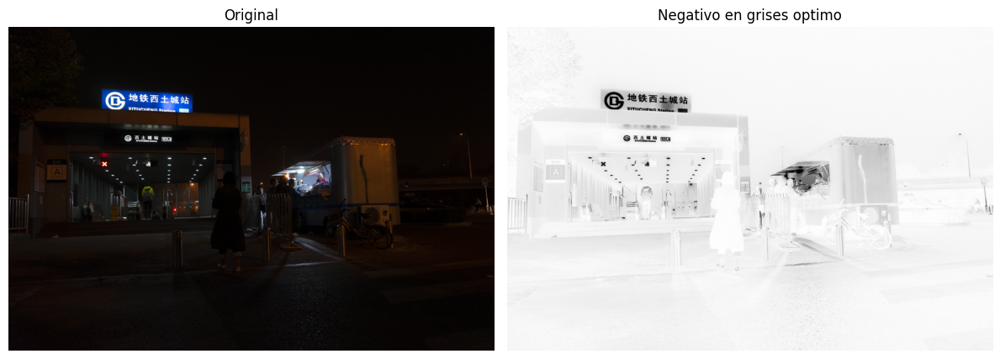

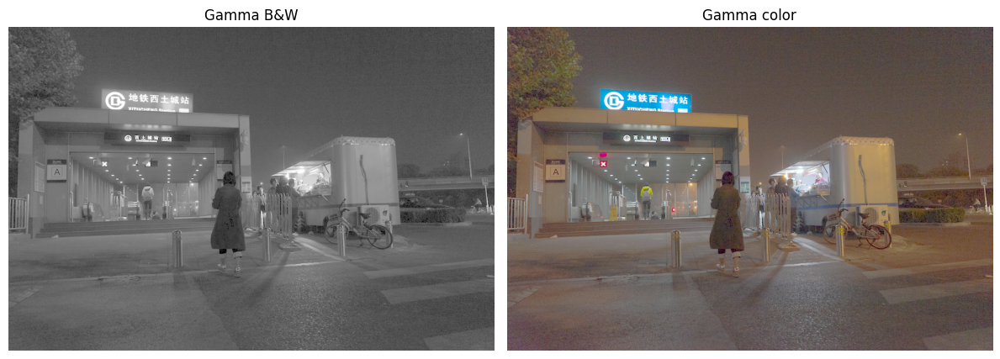

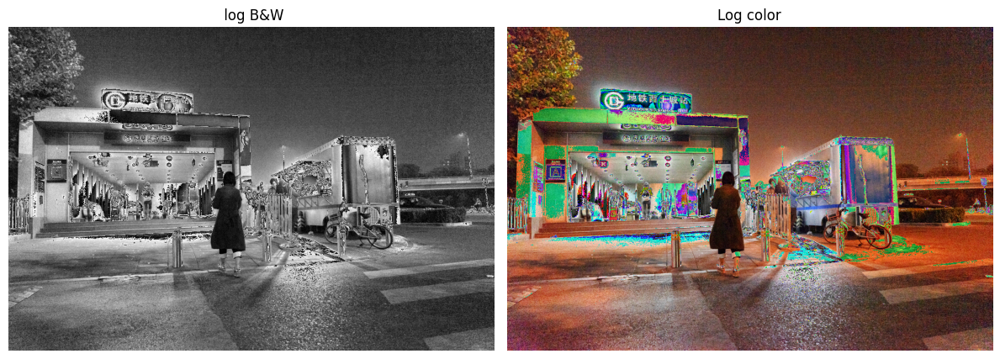

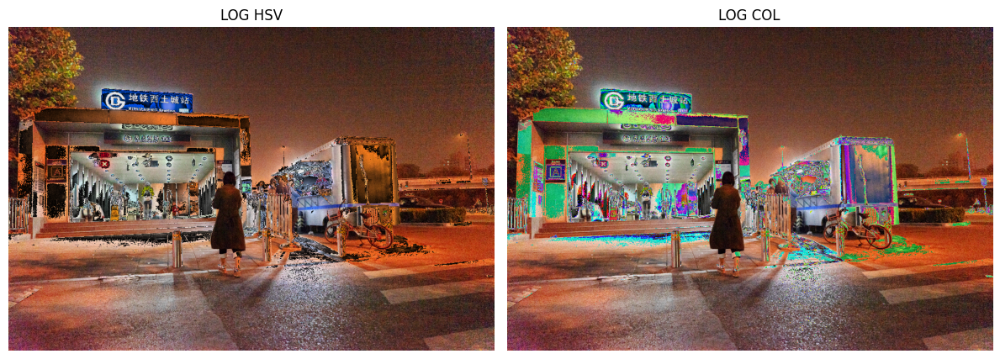

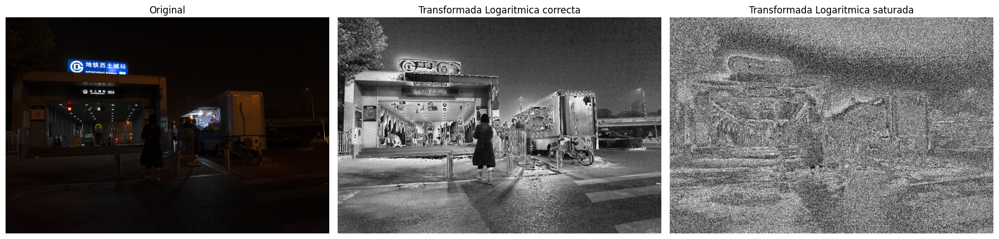

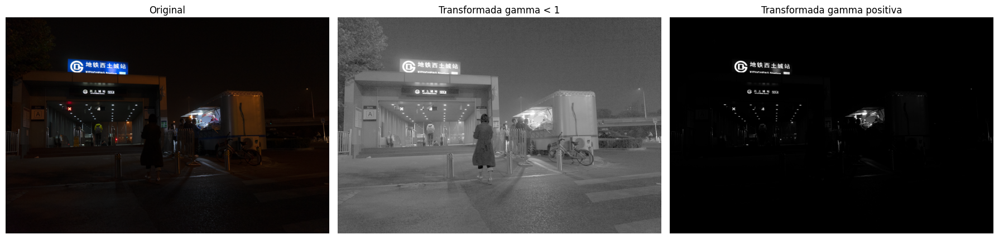

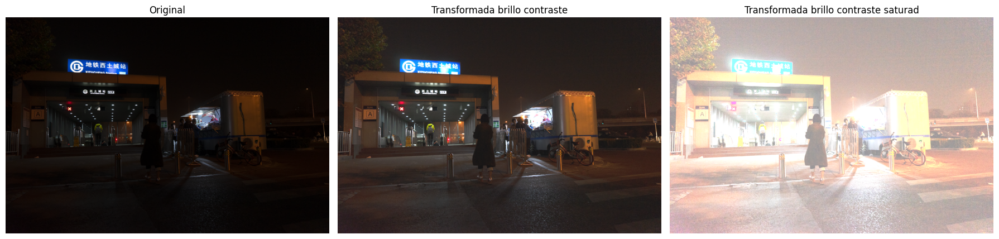

In [12]:
def ajustar_brillo_contraste(imagen, alfa=1, beta=30):
    # alfa: Factor de contraste, beta: Incremento de brillo
    return cv2.convertScaleAbs(imagen, alpha=alfa, beta=beta)


def negativo_en_grises(imagen): 
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    negativo = 255 - imagen_gris
    return negativo

def transformada_logaritmica (imagen, c=10): 
    #C es el factor de luminosidad
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen_normalizada =imagen_gris/ 255.0
    log_imagen = c * np.log(1 + imagen_normalizada)
    log_imagen = np.uint8(255 * log_imagen)    
    return log_imagen

def transformada_logaritmica_color(imagen, c=10):
    imagen_normalizada = imagen / 255.0  # Normalizar la imagen entre 0 y 1
    log_imagen = c * np.log(1 + imagen_normalizada)
    log_imagen = np.uint8(255 * log_imagen)  # Volver a escalar entre 0 y 255
    return log_imagen

def transformada_logaritmica_color_HSV(imagen, c=10):
    hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)
    v = hsv[:, :, 2]
    v_normalizado = v / 255.0
    log_v = c * np.log(1 + v_normalizado)
    log_v = np.uint8(255 * log_v)
    hsv[:, :, 2] = log_v
    imagen_logaritmica = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    
    return imagen_logaritmica

def correccion_gamma(imagen, gamma = 0.3): 
    #Gamma es la potencia a la que se elevan la intensidad de los pixeles
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen_normalizada =imagen_gris/ 255.0
    gamma_imagen = np.power(imagen_normalizada, gamma)
    gamma_imagen = np.uint8(255 * gamma_imagen)    
    return gamma_imagen

def correccion_gamma_color(imagen, gamma=0.3):
    imagen_normalizada = imagen / 255.0  
    gamma_imagen = np.power(imagen_normalizada, gamma)
    gamma_imagen = np.uint8(255 * gamma_imagen)  
    return gamma_imagen


# Funcion personalizada para el tratamiento de las intensidades
def ajuste_intensidad(imagen):
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    # Crear una imagen de salida con las mismas dimensiones
    imagen_salida = np.zeros_like(imagen_gris)

    for i in range(imagen_gris.shape[0]):
        for j in range(imagen_gris.shape[1]):
            valor = imagen_gris[i, j]
            if valor <= 170:
                # Aclarar píxeles oscuros
                imagen_salida[i, j] = np.clip(valor + 50, 0, 255)
            elif valor <= 200:
                # Dejar los píxeles intermedios sin cambios
                imagen_salida[i, j] = valor
            else:
                # Oscurecer píxeles brillantes
                imagen_salida[i, j] = np.clip(valor - 50, 0, 255)
    return imagen_salida
    
    
imagenes_negativo = [negativo_en_grises(img) for img in imagenes]
imagenes_logaritmicas = [transformada_logaritmica(img) for img in imagenes]
imagenes_logaritmicas_saturadas = [transformada_logaritmica(img, c= 150) for img in imagenes]
imagenes_logaritmicas_color = [transformada_logaritmica_color(img) for img in imagenes]
imagenes_logaritmicas_color_hsv = [transformada_logaritmica_color_HSV(img) for img in imagenes]
imagenes_gamma_neg = [correccion_gamma(img) for img in imagenes]
imagenes_gamma_pos = [correccion_gamma(img, gamma = 2) for img in imagenes]
imagenes_gamma_neg_color = [correccion_gamma_color(img) for img in imagenes]
imagenes_contraste = [ajustar_brillo_contraste(img, alfa=2, beta=20) for img in imagenes]
imagenes_contraste_saturados = [ajustar_brillo_contraste(img, alfa=5, beta=150) for img in imagenes]

i=3
comparar_imagenes(imagenes[i], "Original", imagenes_negativo[i], "Negativo en grises optimo")
comparar_imagenes(imagenes_gamma_neg[i], "Gamma B&W", imagenes_gamma_neg_color[i], "Gamma color")
comparar_imagenes(imagenes_logaritmicas[i], " log B&W", imagenes_logaritmicas_color[i], "Log color")
comparar_imagenes(imagenes_logaritmicas_color_hsv[i], "LOG HSV", imagenes_logaritmicas_color[i], "LOG COL")
comparar_tres_imagenes(imagenes[i], "Original", imagenes_logaritmicas[i], "Transformada Logaritmica correcta", imagenes_logaritmicas_saturadas[i], "Transformada Logaritmica saturada")
comparar_tres_imagenes(imagenes[i], "Original", imagenes_gamma_neg[i], "Transformada gamma < 1", imagenes_gamma_pos[i], "Transformada gamma positiva")
comparar_tres_imagenes(imagenes[i], "Original", imagenes_contraste[i], "Transformada brillo contraste", imagenes_contraste_saturados[i], "Transformada brillo contraste saturad")



# 2. Procesamiento del histograma


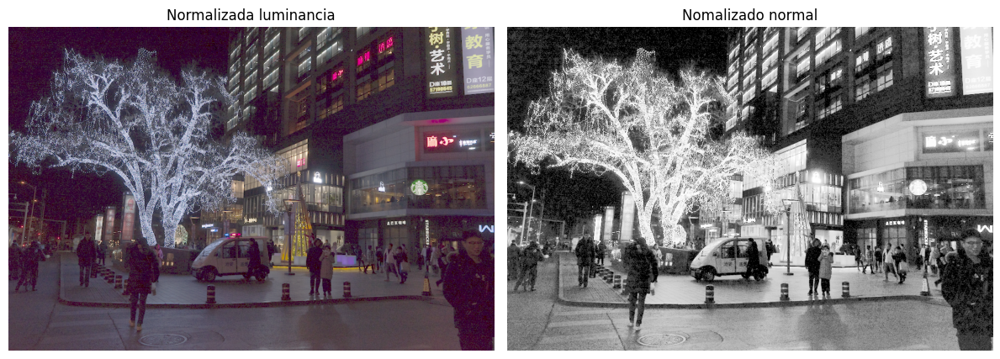

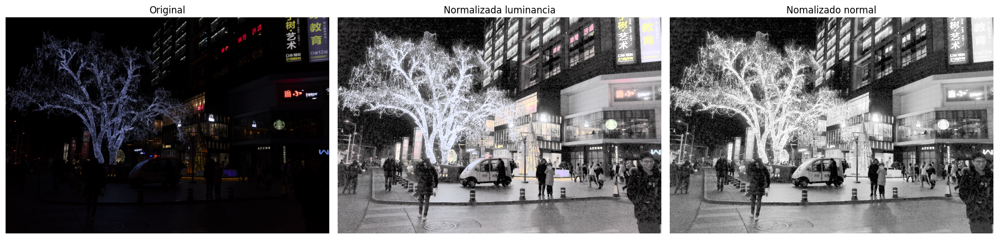

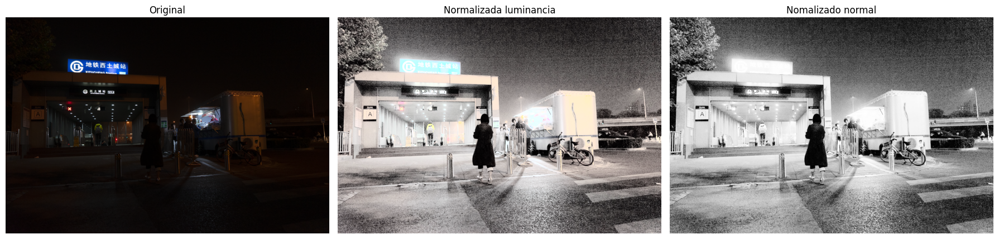

In [4]:
def ecualizar_histograma_luminancia(imagen):
    # Convertir a YUV para ecualizar el canal de luminancia
    yuv = cv2.cvtColor(imagen, cv2.COLOR_BGR2YUV)
    yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0])  # Ecualizar luminancia
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

def ecualizar_histograma_completo(imagen):
    # Convertir la imagen a escala de grises para ecualizar el histograma
    imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen_ecualizada = cv2.equalizeHist(imagen_gris)
    return imagen_ecualizada

imagenes_ecualizadas_luminancia = [ecualizar_histograma_luminancia(img) for img in imagenes]
imagenes_ecualizadas_completo = [ecualizar_histograma_completo(img) for img in imagenes]
j = 0
comparar_imagenes(imagenes_gamma_neg_color[j], "Normalizada luminancia", imagenes_ecualizadas_completo[j], "Nomalizado normal")
comparar_tres_imagenes(imagenes[j], "Original", imagenes_ecualizadas_luminancia[j], "Normalizada luminancia", imagenes_ecualizadas_completo[j], "Nomalizado normal")
comparar_tres_imagenes(imagenes[j+3], "Original", imagenes_ecualizadas_luminancia[j+3], "Normalizada luminancia", imagenes_ecualizadas_completo[j+3], "Nomalizado normal")


# Operadores aritmeticos 

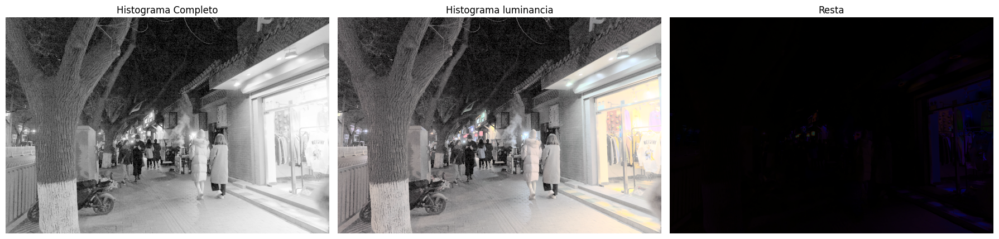

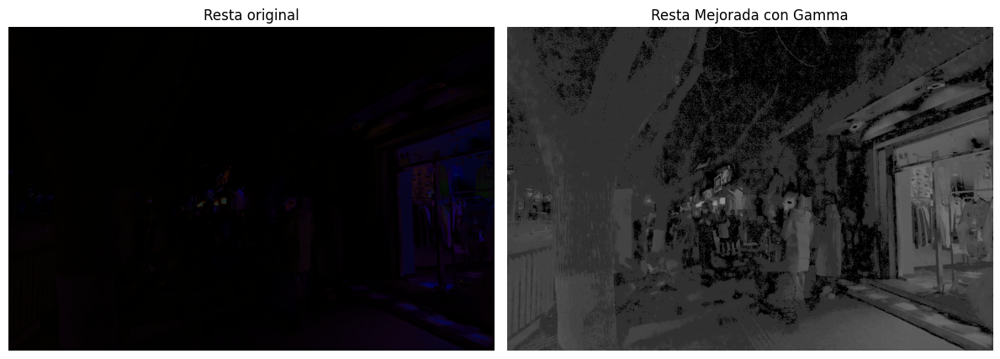

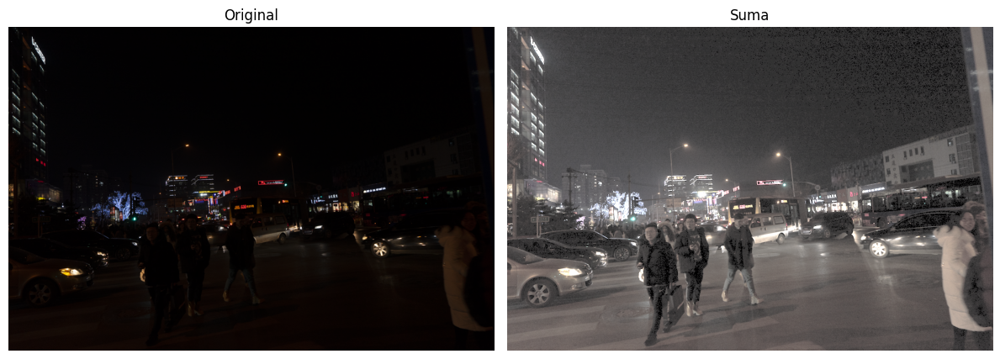

In [5]:

def restar_imagenes(imagen1, imagen2):
    if len(imagen1.shape) == 2:  # Si imagen1 es en escala de grises
        imagen1 = cv2.cvtColor(imagen1, cv2.COLOR_GRAY2BGR)
    if len(imagen2.shape) == 2:  # Si imagen2 es en escala de grises
        imagen2 = cv2.cvtColor(imagen2, cv2.COLOR_GRAY2BGR)
    if imagen1.shape != imagen2.shape:
        imagen2 = cv2.resize(imagen2, (imagen1.shape[1], imagen1.shape[0]))
        
    if imagen1.shape != imagen2.shape:
        raise ValueError("Las imágenes deben tener el mismo tamaño y número de canales")
    # Restar las imágenes
    imagen_resultado = cv2.absdiff(imagen1, imagen2)
    return imagen_resultado


def sumar_imagenes(imagen1, imagen2):
    if len(imagen1.shape) == 2:  # Si imagen1 es en escala de grises
        imagen1 = cv2.cvtColor(imagen1, cv2.COLOR_GRAY2BGR)
    if len(imagen2.shape) == 2:  # Si imagen2 es en escala de grises
        imagen2 = cv2.cvtColor(imagen2, cv2.COLOR_GRAY2BGR)
    if imagen1.shape != imagen2.shape:
        imagen2 = cv2.resize(imagen2, (imagen1.shape[1], imagen1.shape[0]))

    imagen_resultado = cv2.add(imagen1, imagen2)
    return imagen_resultado

k = 2; 
hist1 = ecualizar_histograma_completo(imagenes[k])
hist2 = ecualizar_histograma_luminancia(imagenes[k])
   
rest = restar_imagenes(hist2, hist1)
comparar_tres_imagenes(hist1, "Histograma Completo", hist2, "Histograma luminancia", rest, "Resta")
rest_mejorada = correccion_gamma(rest)
comparar_imagenes(rest, "Resta original", rest_mejorada, "Resta Mejorada con Gamma")

suma = sumar_imagenes(imagenes[k-1], imagenes_gamma_neg[k-1])
comparar_imagenes(imagenes[k-1], "Original", suma, "Suma")

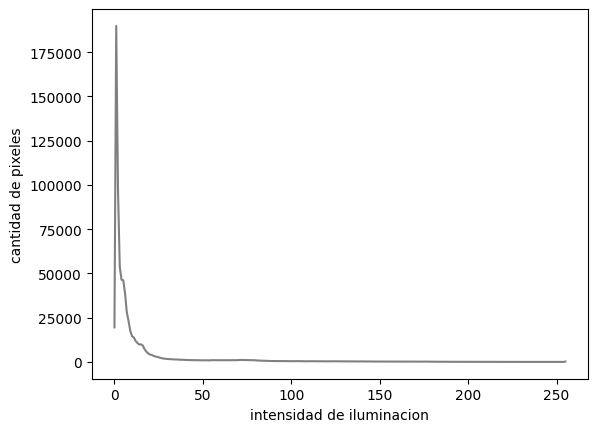

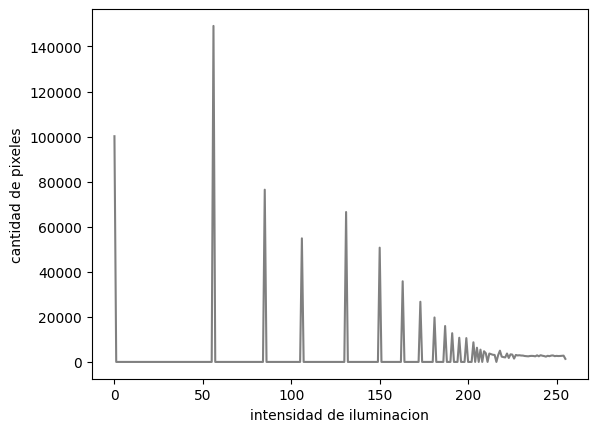

In [11]:
histogram = cv2.calcHist([imagenes[0]], [0], None, [256], [0, 256])
plt.plot(histogram, color='gray' )

plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.show()


histogram1 = cv2.calcHist([imagenes_ecualizadas_completo[0]], [0], None, [256], [0, 256])
plt.plot(histogram1, color='gray' )

plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.show()
